# Generating Miami plots to display TWAS results

**Author:** Michelle Franc Ragsac (mragsac@ucsd.edu)

In this notebook, I'll be plotting the TWAS results for bulk tissue and pseudobulked cell types with `matplotlib`.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from adjustText import adjust_text

## Import pre-processed TWAS results

In [2]:
fn_tissues = "data/twas_all-tissue-all-chr.tsv"
fn_celltypes = "data/twas_all-celltype-all-chr.tsv"

df_twas_tissues = pd.read_csv(fn_tissues, sep="\t", index_col=0).dropna(subset=["TWAS.Z", "TWAS.P"])
df_twas_celltypes = pd.read_csv(fn_celltypes, sep="\t", index_col=0).dropna(subset=["TWAS.Z", "TWAS.P"])

print(f"Number of Unique Tissues (after dropping NAs in TWAS.Z and TWAS.P) : {df_twas_tissues["PANEL"].nunique()}")
print(f"Number of Unique Cell Types (after dropping NAs in TWAS.Z and TWAS.P) : {df_twas_celltypes["PANEL"].nunique()}")

Number of Unique Tissues (after dropping NAs in TWAS.Z and TWAS.P) : 39
Number of Unique Cell Types (after dropping NAs in TWAS.Z and TWAS.P) : 17


In [3]:
df_twas_tissues.head()

,PANEL,FILE,ID,CHR,P0,P1,HSQ,BEST.GWAS.ID,EQTL.ID,NSNP,...,MODEL,MODELCV.R2,MODELCV.PV,BEST.GWAS.Z,EQTL.R2,EQTL.Z,EQTL.GWAS.Z,TWAS.Z,TWAS.P,PANEL.CLEANED
0,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,RP11-206L10,1,-221231,1810060,0.1606,rs11721,rs3131972,104,...,top1,0.100,2.700000e-09,6.1,0.1030,-6.03,-0.35061,0.3506,0.726,adipose (subcutaneous)
1,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,LINC00115,1,-173795,1827522,0.1864,rs11721,rs3131972,112,...,top1,0.150,1.800000e-13,6.1,0.1540,-7.24,-0.35061,0.3506,0.726,adipose (subcutaneous)
2,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,NOC2L,1,-55419,1959309,0.3259,rs11721,rs3748595,126,...,top1,0.170,1.500000e-14,6.1,0.1670,-7.62,-0.57858,0.5786,0.563,adipose (subcutaneous)
3,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,PLEKHN1,1,-33504,1975108,0.1120,rs11721,rs3748592,126,...,top1,0.054,1.500000e-05,6.1,0.0544,4.52,-0.50812,-0.5081,0.611,adipose (subcutaneous)
4,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,RP11-54O7,1,-4035,1998051,0.2768,rs11721,rs3128117,126,...,top1,0.200,2.500000e-17,6.1,0.2000,-8.50,0.04734,-0.0473,0.962,adipose (subcutaneous)


In [4]:
# Calculate the Bonferroni threshold we should use for p-values
total_tissue_gene_pairs = df_twas_tissues.shape[0]
total_celltype_gene_pairs = df_twas_celltypes.shape[0]

print(f"Total Number of GENE-TISSUE    Pairs (not NA) : {total_tissue_gene_pairs}")
print(f"Total Number of GENE-CELL-TYPE Pairs (not NA) : {total_celltype_gene_pairs}")
print("")

bonferroni_tissue_threshold = 0.05 / total_tissue_gene_pairs
bonferroni_celltype_threshold = 0.05 / total_celltype_gene_pairs

print(f"Bonferroni-corrected p-value Threshold (GENE-TISSUE)    : {bonferroni_tissue_threshold}")
print(f"Bonferroni-corrected p-value Threshold (GENE-CELL-TYPE) : {bonferroni_celltype_threshold}")

Total Number of GENE-TISSUE    Pairs (not NA) : 225678
Total Number of GENE-CELL-TYPE Pairs (not NA) : 16268

Bonferroni-corrected p-value Threshold (GENE-TISSUE)    : 2.2155460434778757e-07
Bonferroni-corrected p-value Threshold (GENE-CELL-TYPE) : 3.073518564052127e-06


In [5]:
df_twas_tissues.head() # preview the columns, etc.

,PANEL,FILE,ID,CHR,P0,P1,HSQ,BEST.GWAS.ID,EQTL.ID,NSNP,...,MODEL,MODELCV.R2,MODELCV.PV,BEST.GWAS.Z,EQTL.R2,EQTL.Z,EQTL.GWAS.Z,TWAS.Z,TWAS.P,PANEL.CLEANED
0,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,RP11-206L10,1,-221231,1810060,0.1606,rs11721,rs3131972,104,...,top1,0.100,2.700000e-09,6.1,0.1030,-6.03,-0.35061,0.3506,0.726,adipose (subcutaneous)
1,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,LINC00115,1,-173795,1827522,0.1864,rs11721,rs3131972,112,...,top1,0.150,1.800000e-13,6.1,0.1540,-7.24,-0.35061,0.3506,0.726,adipose (subcutaneous)
2,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,NOC2L,1,-55419,1959309,0.3259,rs11721,rs3748595,126,...,top1,0.170,1.500000e-14,6.1,0.1670,-7.62,-0.57858,0.5786,0.563,adipose (subcutaneous)
3,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,PLEKHN1,1,-33504,1975108,0.1120,rs11721,rs3748592,126,...,top1,0.054,1.500000e-05,6.1,0.0544,4.52,-0.50812,-0.5081,0.611,adipose (subcutaneous)
4,adipose_subcutaneous,/expanse/lustre/projects/ddp412/tamariutabarte...,RP11-54O7,1,-4035,1998051,0.2768,rs11721,rs3128117,126,...,top1,0.200,2.500000e-17,6.1,0.2000,-8.50,0.04734,-0.0473,0.962,adipose (subcutaneous)


### Add column for plotting position

Let's just add "padding" so that when we plot the Miami, we have spacing between our chromosomes.

In [6]:
chrom_padding = 4e7

# Annotate table with "running position" for Manhattan plot generation
# and add "padding" so that there are spaces between each chromosome
chrom_lengths_tissues = df_twas_tissues.sort_values(["CHR", "P1"]).groupby("CHR")["P1"].max() + chrom_padding
chrom_lengths_tissues[22] = chrom_lengths_tissues[22] - chrom_padding # the last chromosome doesn't need padding ...
chrom_offsets_tissues = chrom_lengths_tissues.cumsum().shift(1, fill_value=0) # calculate running position total

df_twas_tissues["Position"] = df_twas_tissues["P1"] + df_twas_tissues["CHR"].map(chrom_offsets_tissues)
chrom_midpoints_tissues = df_twas_tissues.groupby("CHR")["Position"].mean()

# Let's do the same thing as the previous cell for the cell type table
chrom_lengths_celltypes = df_twas_celltypes.sort_values(["CHR", "P1"]).groupby("CHR")["P1"].max() + chrom_padding
chrom_lengths_celltypes[22] = chrom_lengths_celltypes[22] - chrom_padding # the last chromosome doesn't need padding ...
chrom_offsets_celltypes = chrom_lengths_celltypes.cumsum().shift(1, fill_value=0) # calculate running position total

df_twas_celltypes["Position"] = df_twas_celltypes["P1"] + df_twas_celltypes["CHR"].map(chrom_offsets_celltypes)
chrom_midpoints_celltypes = df_twas_celltypes.groupby("CHR")["Position"].mean()

### Add column for defining point colors

In [7]:
# Add chromosome coloring information for the dataframe for plotting
chrom_colors = ["silver", "dimgray"]
cmap = { c:chrom_colors[i % 2] for i,c in enumerate(df_twas_tissues["CHR"].unique())}

df_twas_tissues["CHROM_COLOR"] = df_twas_tissues["CHR"].map(cmap)
df_twas_celltypes["CHROM_COLOR"] = df_twas_celltypes["CHR"].map(cmap)

## Generate Miami plots

We will define a method to handle all of the plotting, and then we can fine-tune things in Affinity afterward to ensure points are labeled properly.

In [8]:
import matplotlib as mpl

# preserve the "font" status of the text versus as outlines for pdf and svg exports
# https://physicalmodelingwithpython.blogspot.com/2015/06/making-plots-for-publication.html
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['svg.fonttype'] = 'none'

### Define Miami plot method

In [ ]:
def generate_twas_miami_plot(
    df, name, significance_p,
    chrom_midpoints,
    output_fn="",
    significance_z=1.96,
    significance_color="royalblue", # changed default from manhattan
    s=5, xaxis_padding=5e7
):
    fig,ax = plt.subplots(1, 1, figsize=(9,7)) # larger canvas gives adjust_text room to separate dense gene labels

    # Plot all of the points within the particular "name" (i.e., tissue or cell type of interest)
    subset = df.loc[df["PANEL"] == name]
    name_formatted = subset["PANEL.CLEANED"].unique()[0]
    highlighted = subset.loc[subset["TWAS.P"] < significance_p]

    pt1 = ax.scatter(
        subset["Position"], subset["TWAS.Z"], c=subset["CHROM_COLOR"], s=s, alpha=.6,
        rasterized=True
    )
    pt2 = ax.scatter(
        highlighted["Position"], highlighted["TWAS.Z"], c=significance_color, s=s+2, alpha=.7,
        rasterized=True
    )
    # I changed the default color from the manhattan plot from earlier
    ln1 = ax.axhline(-significance_z, color="midnightblue", linestyle="--", label=f"Z = {significance_z}")
    ln2 = ax.axhline(significance_z, color="midnightblue", linestyle="--", label=f"Z = {significance_z}")

    # Label the subset that we're looking at with the "fancy" formatting
    title = ax.annotate(name_formatted, (0, subset["TWAS.Z"].max()))

    texts = []
    for _,row in highlighted.iterrows():
        texts.append(ax.text(row["Position"], row["TWAS.Z"], row["ID"],
            ha='center', va='center',
            fontsize="x-small", fontstyle='italic',
            bbox=dict(
                facecolor='white', edgecolor=significance_color, boxstyle='round,pad=.15', linewidth=.3)
        ))

    # Stronger repulsion so dense significant-gene clusters (e.g. the 17q12-21
    # asthma locus) no longer overlap: bigger expand + an explicit force_text,
    # which the larger figure above gives room to act on.
    adjust_text(
        texts,
        expand=(1.5, 2.4),
        force_text=(0.5, 1.0),
        arrowprops=dict(arrowstyle='simple', color='#A3C5D9', lw=1), # changed to color in manhattan
        min_arrow_len=3,
        ax=ax,
    )

    ax.set_xticks(chrom_midpoints) # label chromosome-by-chromosome instead of position
    ax.set_xticklabels(chrom_midpoints.index.astype(int), fontsize=7)
    ax.set_xlim(df["Position"].min() - xaxis_padding, df["Position"].max() + xaxis_padding)
    ax.set_xlabel("Chromosome")
    ax.set_ylabel("TWAS Z-score")

    plt.tight_layout()

    if output_fn != "":
        plt.savefig(output_fn, format="svg", dpi=1200)
    plt.show()
    return

### Generate individual Miami plots for all tissues and cell types

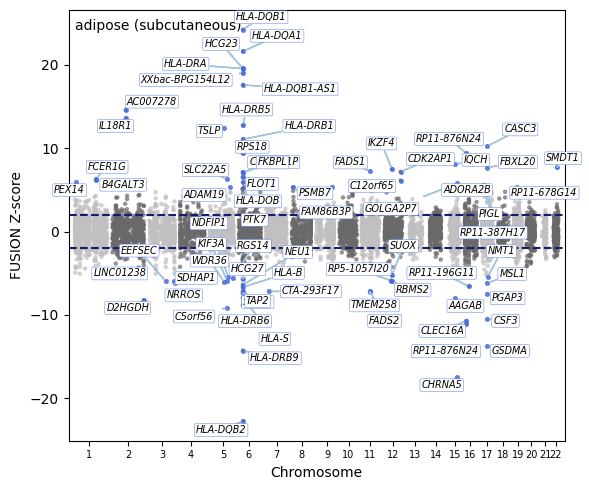

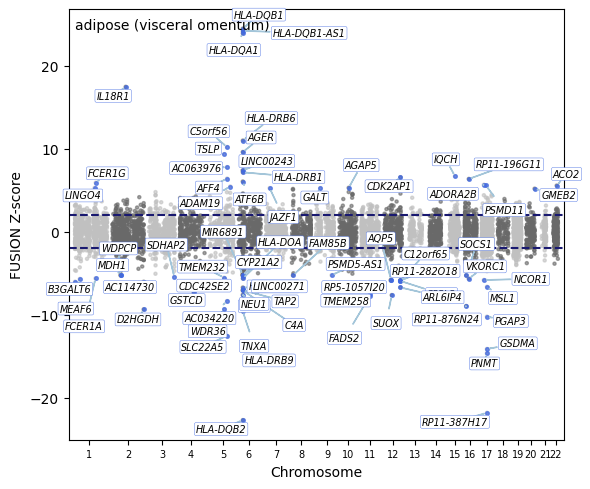

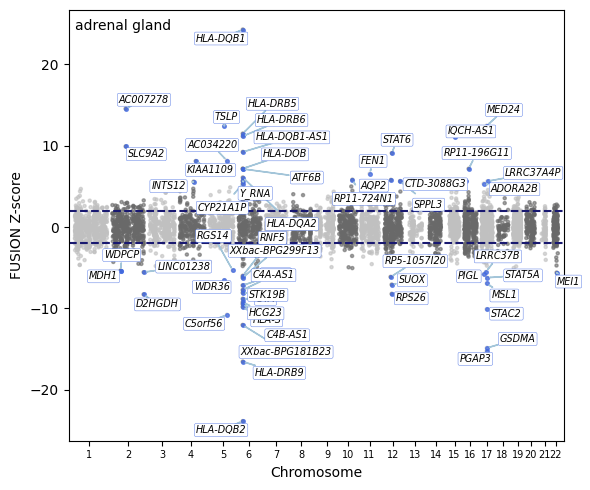

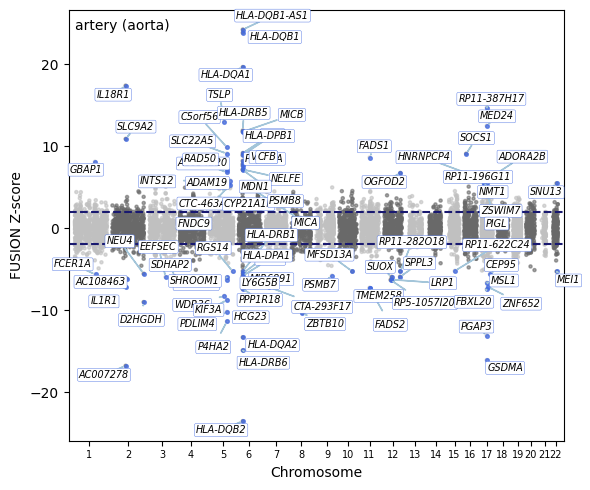

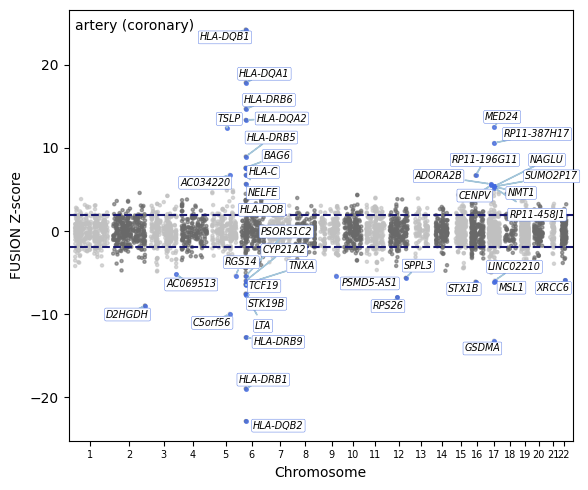

...

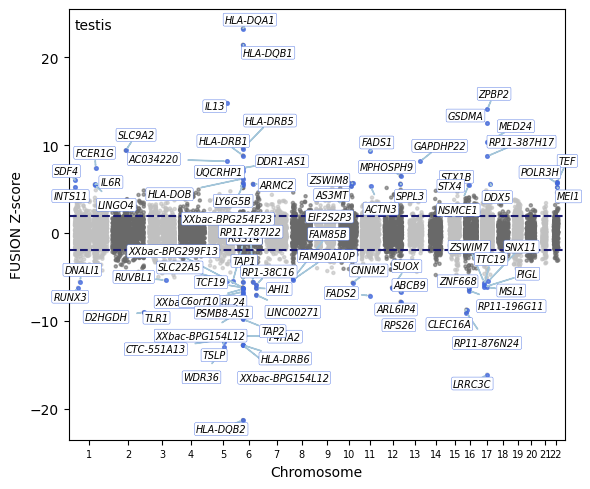

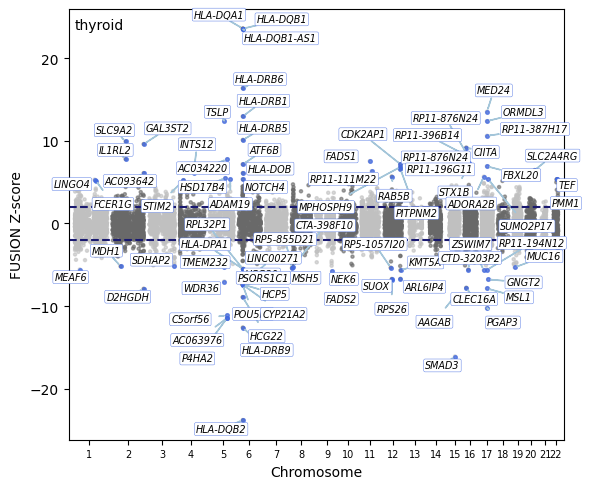

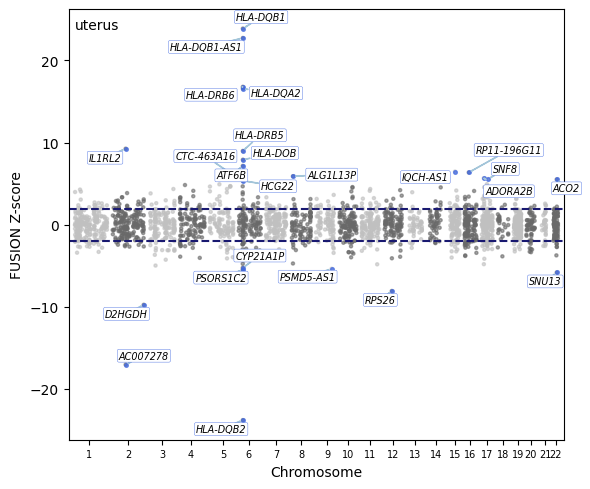

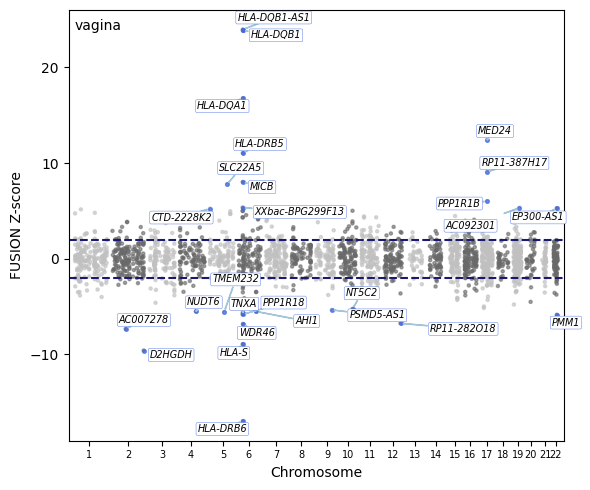

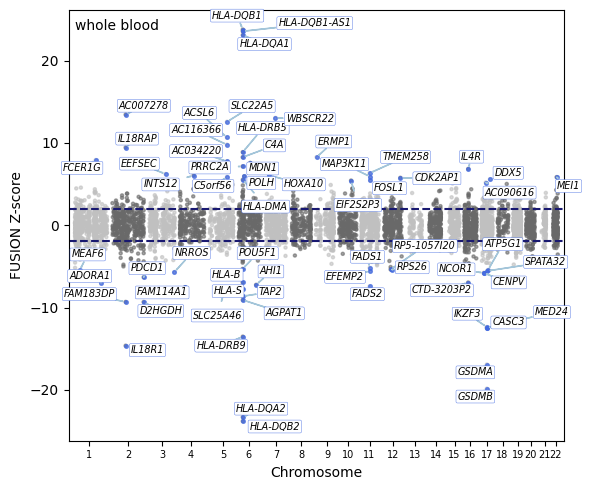

In [10]:
for t in df_twas_tissues["PANEL"].unique():
    generate_twas_miami_plot(
        df_twas_tissues, t, bonferroni_tissue_threshold, chrom_midpoints_tissues,
        output_fn=f"svg/miami_TISSUE_{t}.svg"
    )

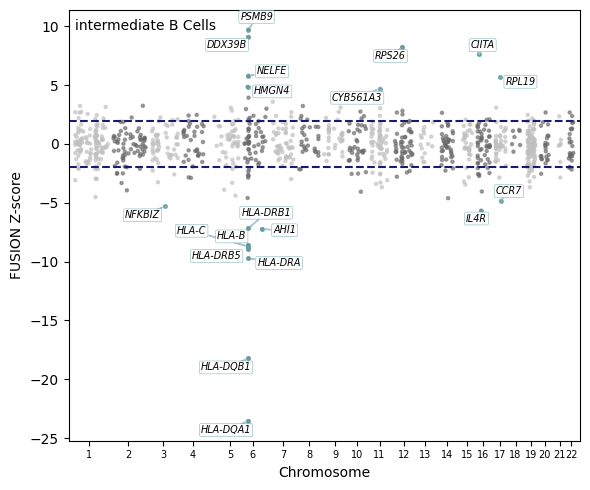

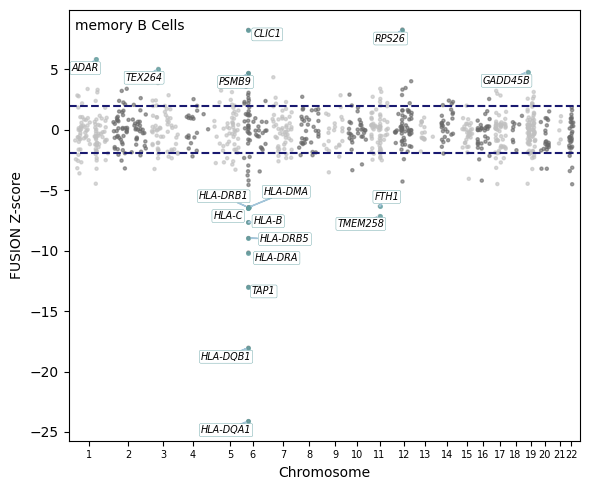

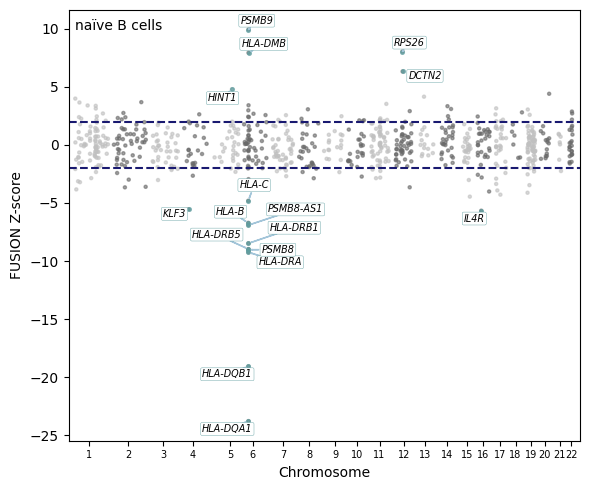

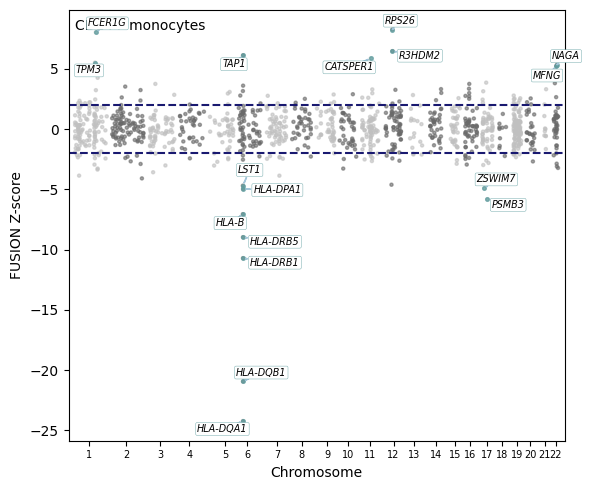

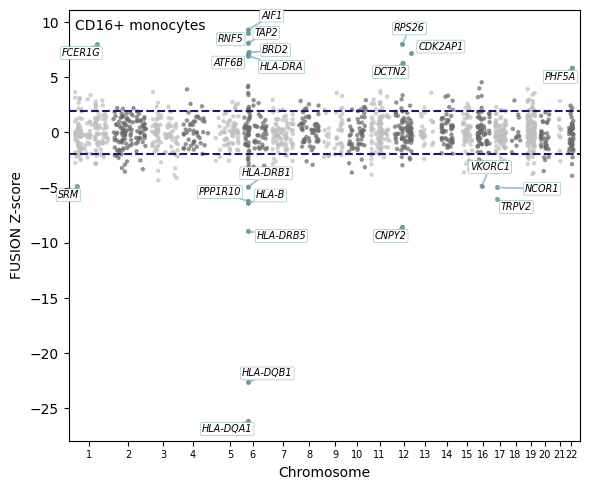

...

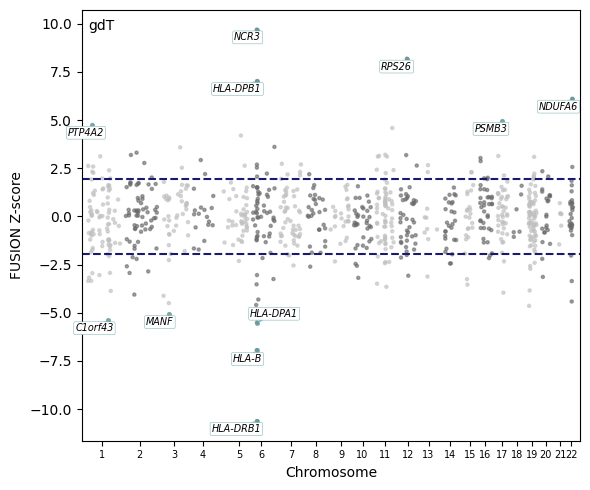

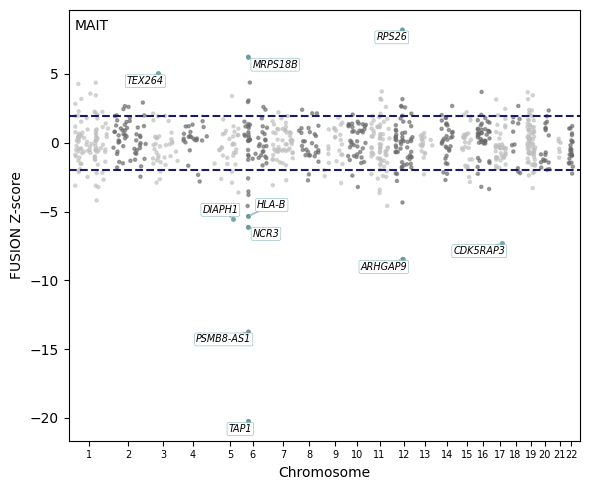

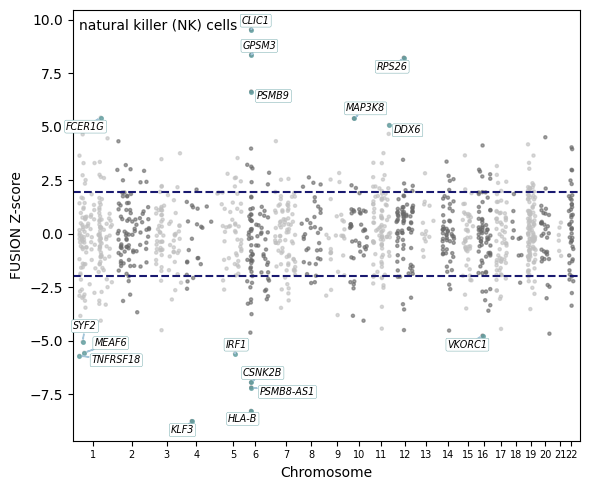

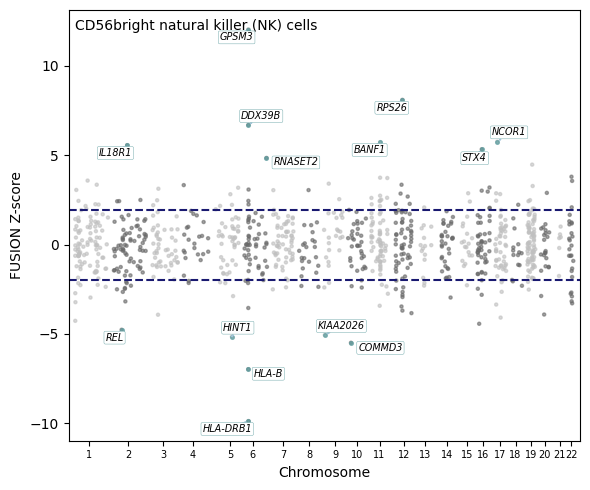

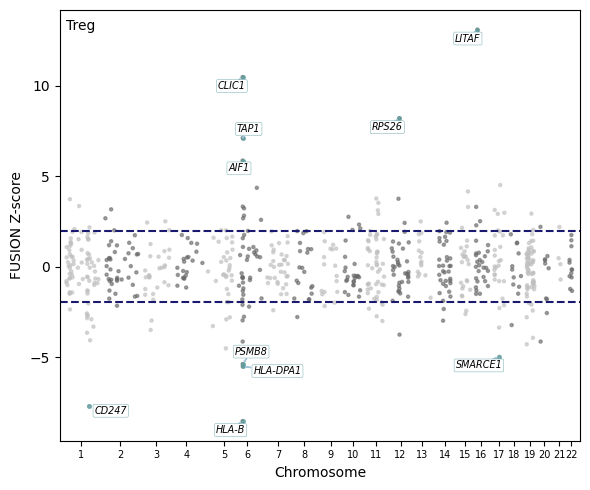

In [11]:
for c in df_twas_celltypes["PANEL"].unique():
    generate_twas_miami_plot(
        df_twas_celltypes, c, bonferroni_celltype_threshold, chrom_midpoints_celltypes,
        significance_color="cadetblue",
        output_fn=f"svg/miami_CELLTYPE_{c}.svg"
    )

### Generate **Miami plot panels** for the supplementary figure section

In [12]:
df_twas_tissues["PANEL"].unique()

array(['adipose_subcutaneous', 'adipose_visceral_omentum',
       'adrenal_gland', 'artery_aorta', 'artery_coronary',
       'artery_tibial', 'brain_basalganglia', 'brain_cerebellum',
       'brain_cortex', 'brain_limbic', 'brain_spinal_cord_cervical_c-1',
       'brain_substantia_nigra', 'breast_mammary_tissue',
       'cells_cultured_fibroblasts', 'cells_ebv-transformed_lymphocytes',
       'colon_sigmoid', 'colon_transverse', 'esophagus_mucosa',
       'esophagus_muscularis', 'heart_atrial_appendage',
       'heart_left_ventricle', 'liver', 'lung', 'minor_salivary_gland',
       'muscle_skeletal', 'nerve_tibial', 'ovary', 'pancreas',
       'pituitary', 'prostate', 'skin_not_sun_exposed_suprapubic',
       'skin_sun_exposed_lower_leg', 'spleen', 'stomach', 'testis',
       'thyroid', 'uterus', 'vagina', 'whole_blood'], dtype=object)

In [13]:
tissues_panel_1 = [
    'adipose_subcutaneous',
    'adipose_visceral_omentum',
    'adrenal_gland',
    'artery_aorta',
    'artery_coronary',
    'artery_tibial'
]

tissues_panel_2 = [
    'brain_basalganglia',
    'brain_cerebellum',
    'brain_cortex',
    'brain_limbic',
    'brain_spinal_cord_cervical_c-1',
    'brain_substantia_nigra'
]

tissues_panel_3 = [
    'breast_mammary_tissue',
    'cells_cultured_fibroblasts',
    'cells_ebv-transformed_lymphocytes',
    'colon_sigmoid',
    'colon_transverse',
    'esophagus_mucosa',
]

tissues_panel_4 = [
    'esophagus_muscularis',
    'heart_atrial_appendage',
    'heart_left_ventricle',
    'liver',
    'lung',
    'minor_salivary_gland',
]

tissues_panel_5 = [
    'muscle_skeletal',
    'nerve_tibial',
    'ovary',
    'pancreas',
    'pituitary',
    'prostate',
]

tissues_panel_6 = [
    'skin_not_sun_exposed_suprapubic',
    'skin_sun_exposed_lower_leg',
    'spleen',
    'stomach',
    'testis',
    'thyroid',
]

tissues_panel_7 = [
    'uterus',
    'vagina',
    'whole_blood'
]

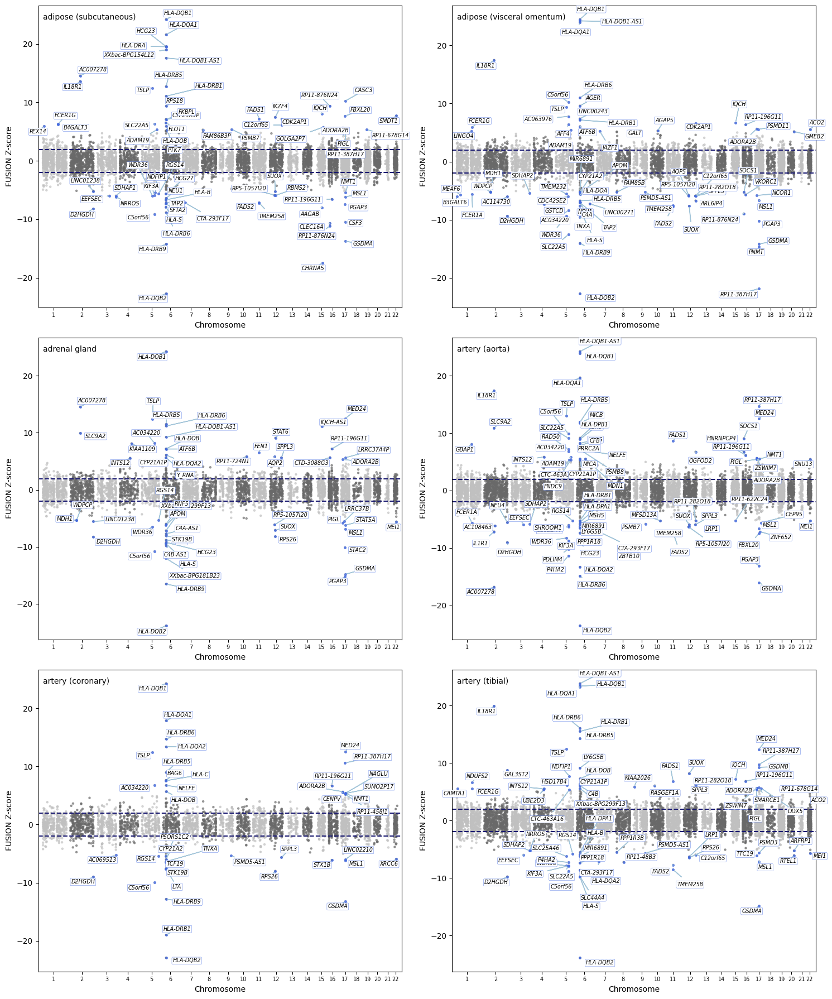

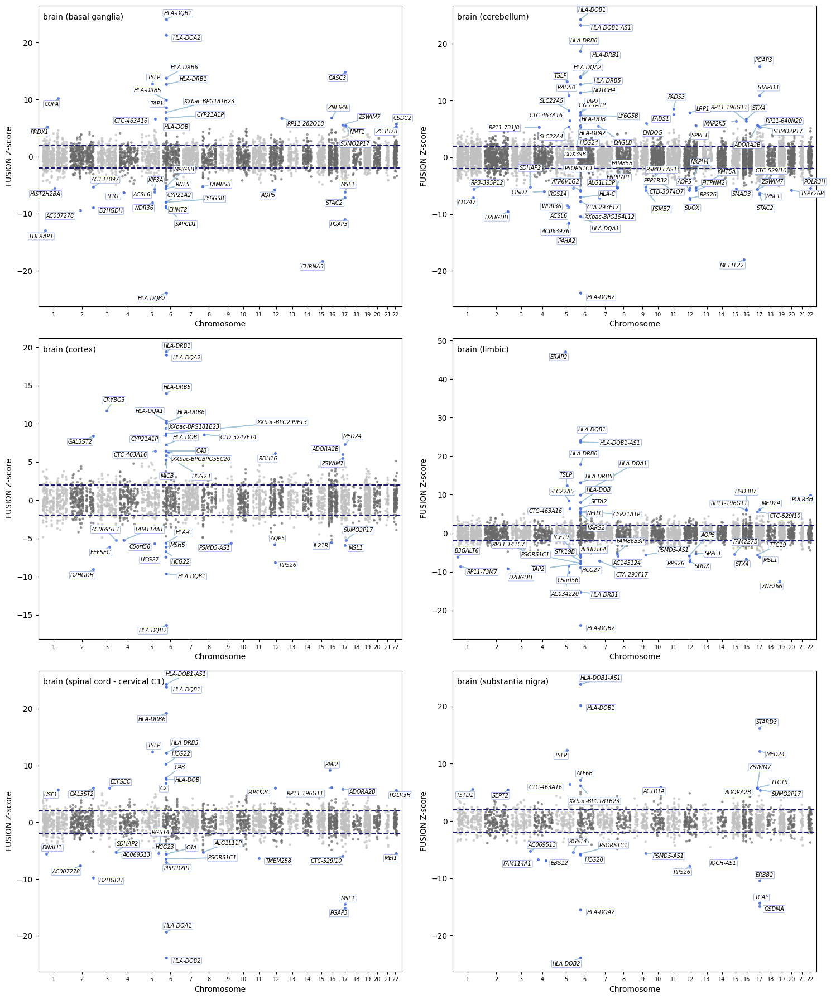

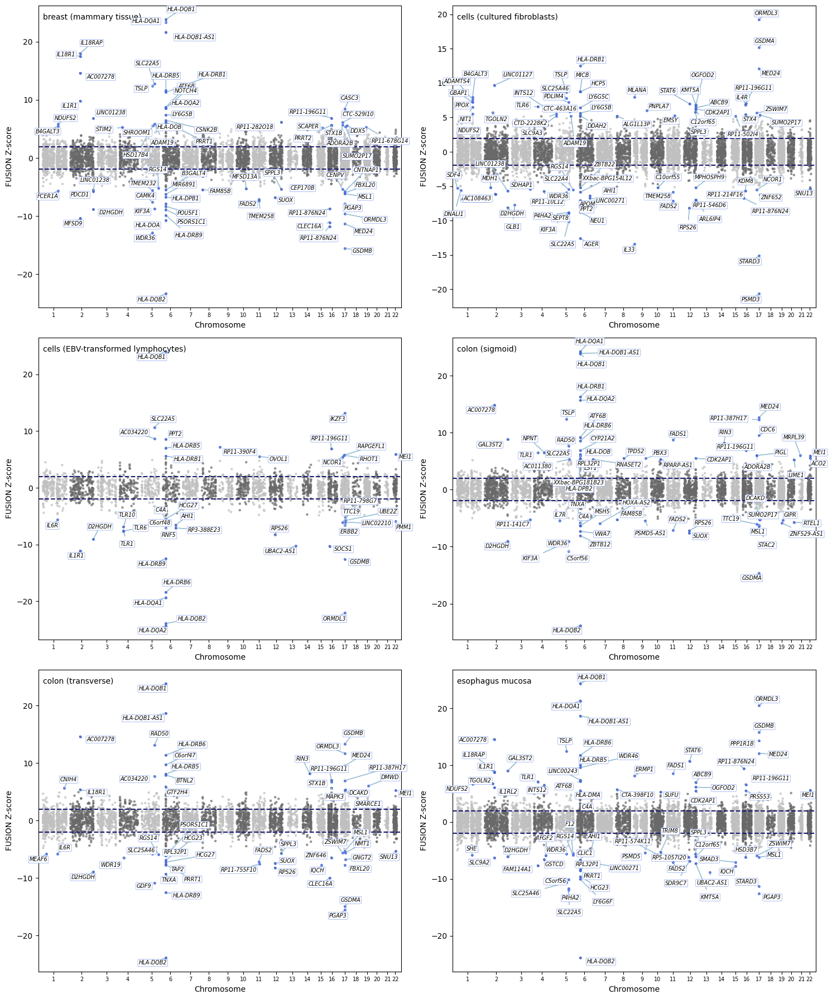

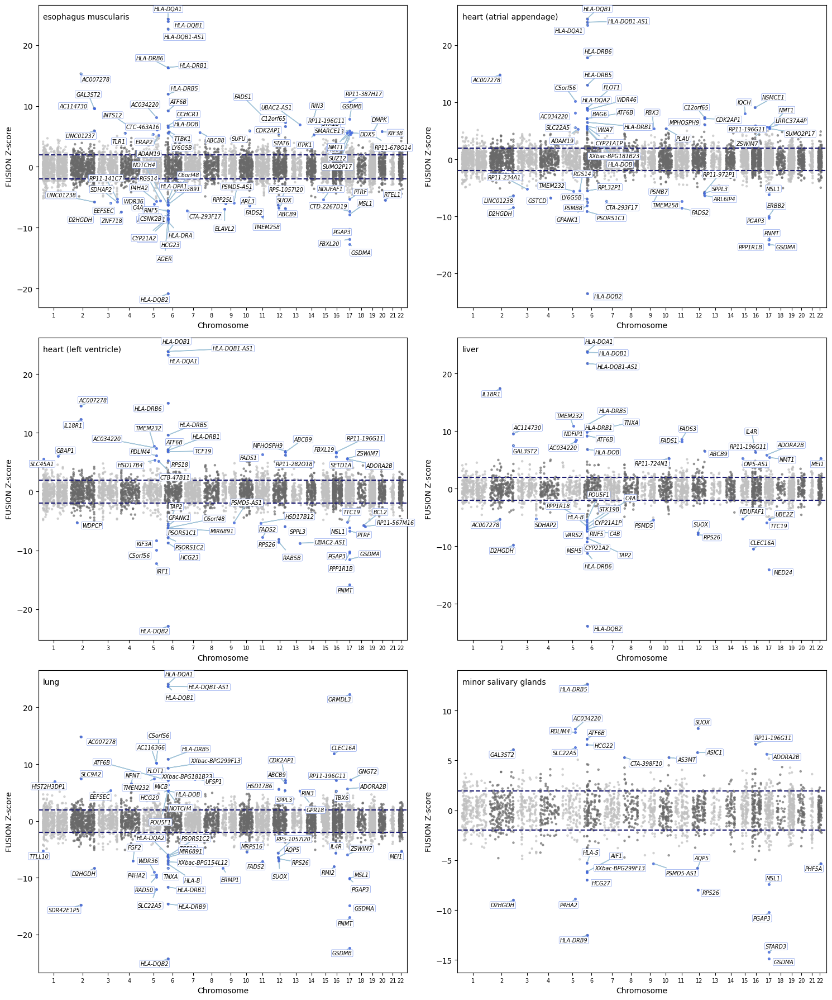

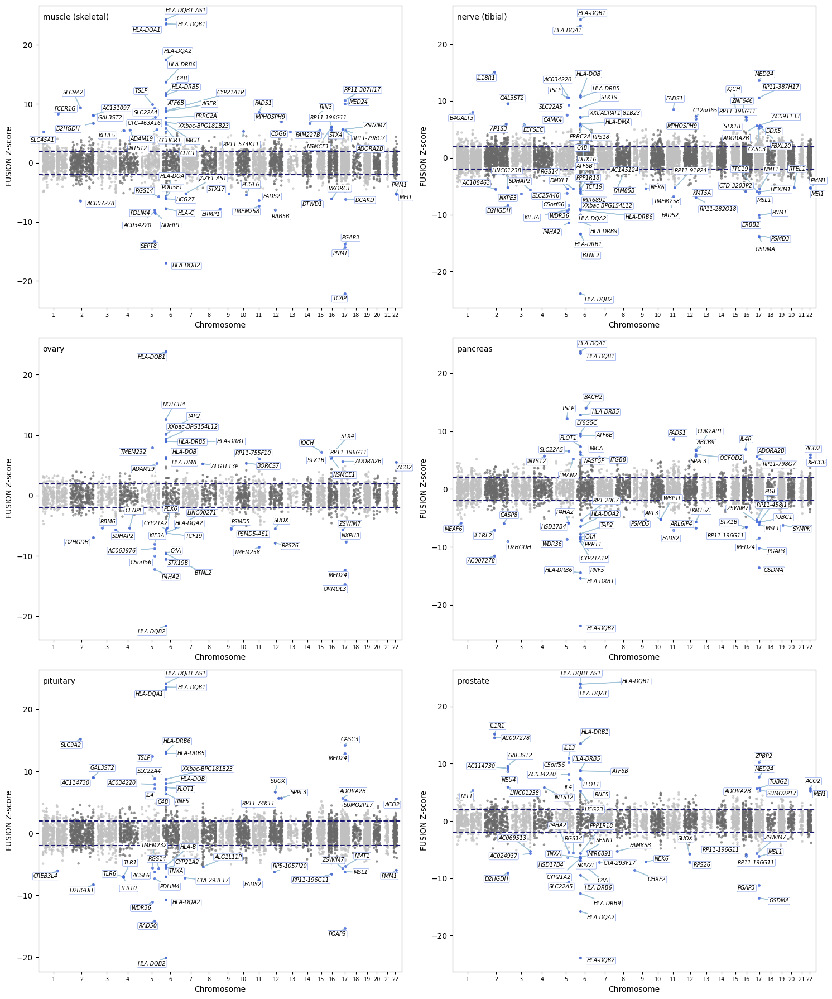

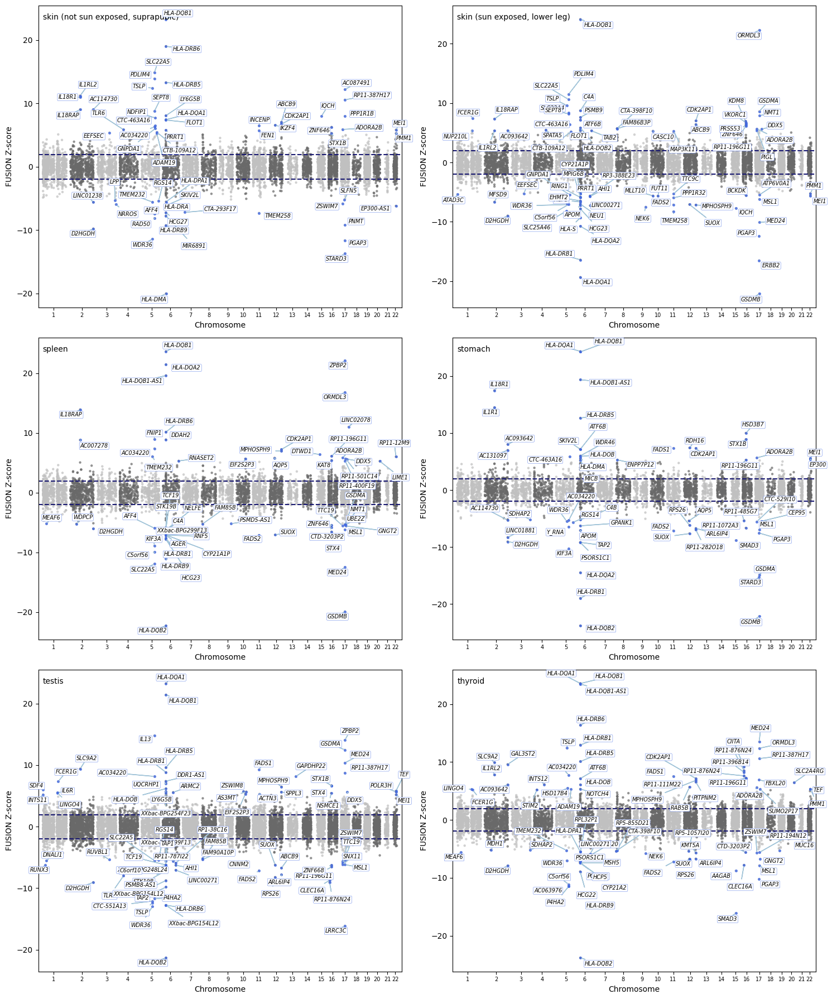

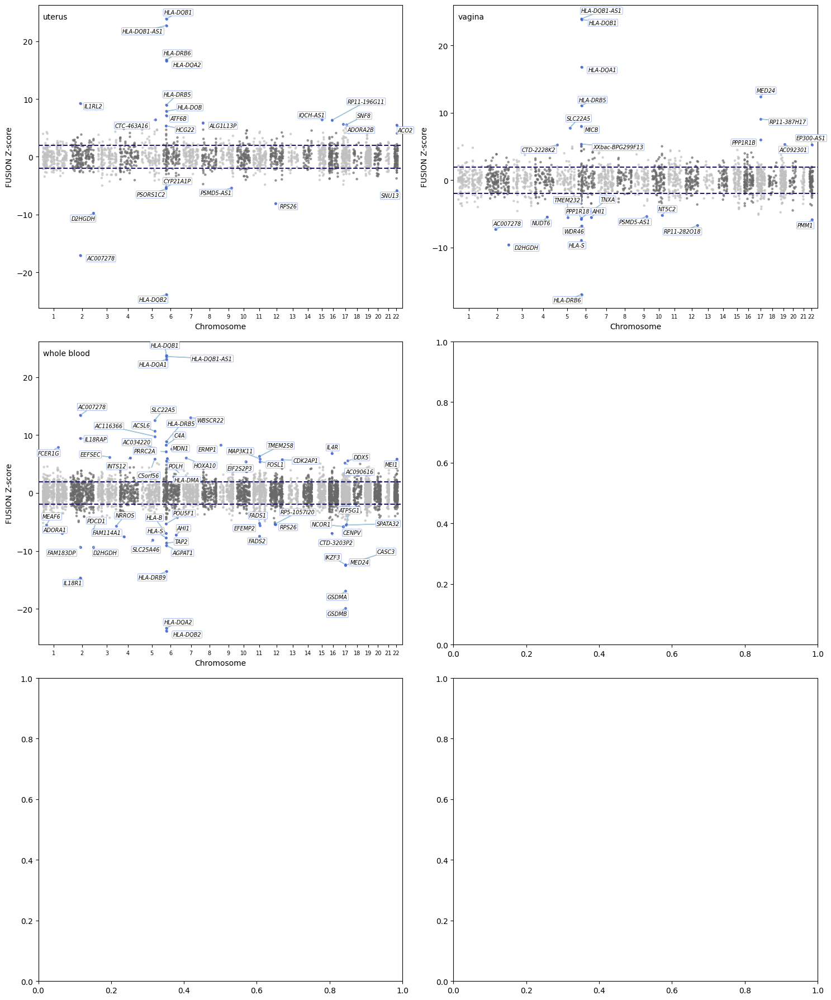

In [14]:
index = 0
for tissue_panel in [tissues_panel_1, tissues_panel_2, tissues_panel_3, tissues_panel_4, tissues_panel_5, tissues_panel_6, tissues_panel_7]:
    index += 1

    fig,axes = plt.subplots(3, 2, figsize=(15,18))
    axs = axes.flatten()

    significance_z=1.96
    significance_color="royalblue"
    s=5
    xaxis_padding=5e7

    for t,ax in zip(tissue_panel,axs):
        subset = df_twas_tissues.loc[df_twas_tissues["PANEL"] == t]
        name_formatted = subset["PANEL.CLEANED"].unique()[0]
        highlighted = subset.loc[subset["TWAS.P"] < bonferroni_tissue_threshold]

        pt1 = ax.scatter(
            subset["Position"], subset["TWAS.Z"], c=subset["CHROM_COLOR"], s=s, alpha=.6,
            rasterized=False
        )

        # I changed the default color from the manhattan plot from earlier
        ln1 = ax.axhline(-significance_z, color="midnightblue", linestyle="--", label=f"Z = {significance_z}")
        ln2 = ax.axhline(significance_z, color="midnightblue", linestyle="--", label=f"Z = {significance_z}")
        pt2 = ax.scatter(
            highlighted["Position"], highlighted["TWAS.Z"], c=significance_color, s=s+2, alpha=.7,
            rasterized=True
        )

        # Label the subset that we're looking at with the "fancy" formatting
        title = ax.annotate(name_formatted, (0, subset["TWAS.Z"].max()))

        texts = []
        for _,row in highlighted.iterrows():
            texts.append(ax.text(row["Position"], row["TWAS.Z"], row["ID"],
                ha='center', va='center',
                fontsize="x-small", fontstyle='italic',
                bbox=dict(
                    facecolor='white', edgecolor=significance_color, boxstyle='round,pad=.15', linewidth=.3)
            ))

        adjust_text(
            texts,
            expand=(1.1,1.5),
            arrowprops=dict(arrowstyle='simple', color='#A3C5D9', lw=1), # changed to color in manhattan
            min_arrow_len=3,
            ax=ax,
        )

        ax.set_xticks(chrom_midpoints_tissues) # label chromosome-by-chromosome instead of position
        ax.set_xticklabels(chrom_midpoints_tissues.index.astype(int), fontsize=7)
        ax.set_xlim(df_twas_tissues["Position"].min() - xaxis_padding, df_twas_tissues["Position"].max() + xaxis_padding)
        ax.set_xlabel("Chromosome")
        ax.set_ylabel("FUSION Z-score")

    plt.tight_layout()
    plt.savefig(f"svg/miami_supplement_TISSUES-PART-{index}.svg", format="svg", dpi=1200)
    plt.show()

---

In [15]:
df_twas_celltypes["PANEL"].unique()

array(['b_intermediate', 'b_memory', 'b_naive', 'cd14_mono', 'cd16_mono',
       'cd4_ctl', 'cd4_naive', 'cd4_tcm', 'cd4_tem', 'cd8_naive',
       'cd8_tcm', 'cd8_tem', 'gdt', 'mait', 'nk', 'nk_cd56bright', 'treg'],
      dtype=object)

In [16]:
celltypes_panel_1 = [
    'b_intermediate',
    'b_memory',
    'b_naive',
    'cd14_mono',
    'cd16_mono',
    'cd4_ctl',
]

celltypes_panel_2 = [
    'cd4_naive',
    'cd4_tcm',
    'cd4_tem',
    'cd8_naive',
    'cd8_tcm',
    'cd8_tem',
]

celltypes_panel_3 = [
    'gdt',
    'mait',
    'nk',
    'nk_cd56bright',
    'treg'
]

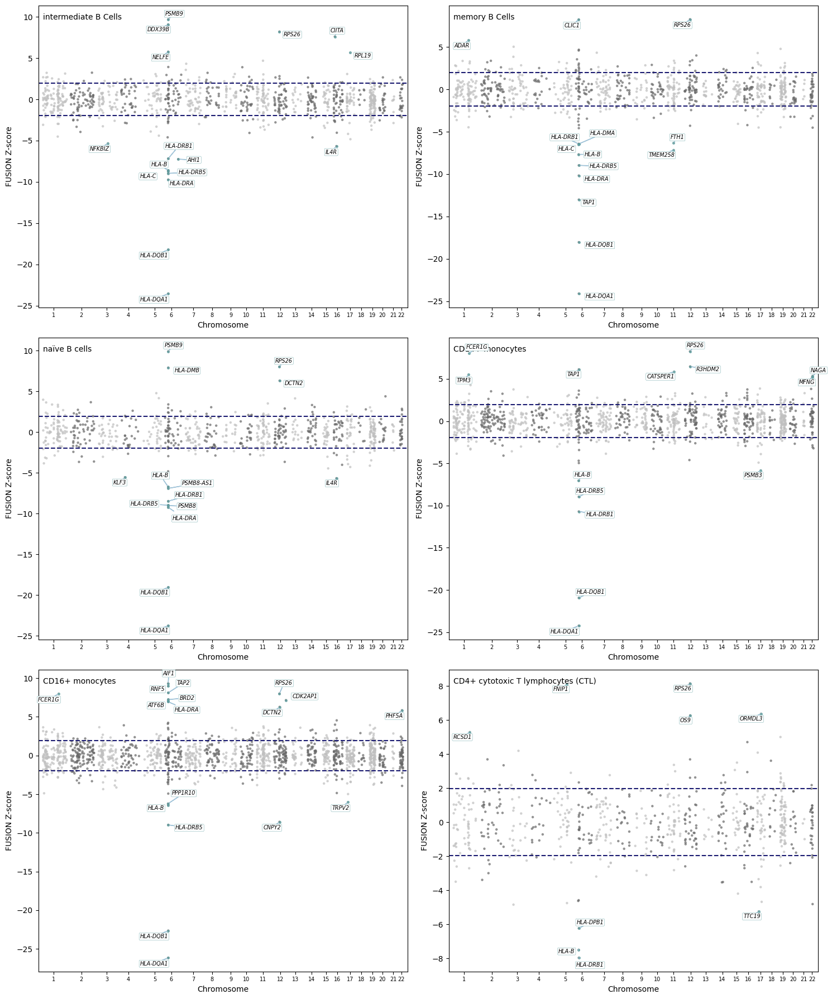

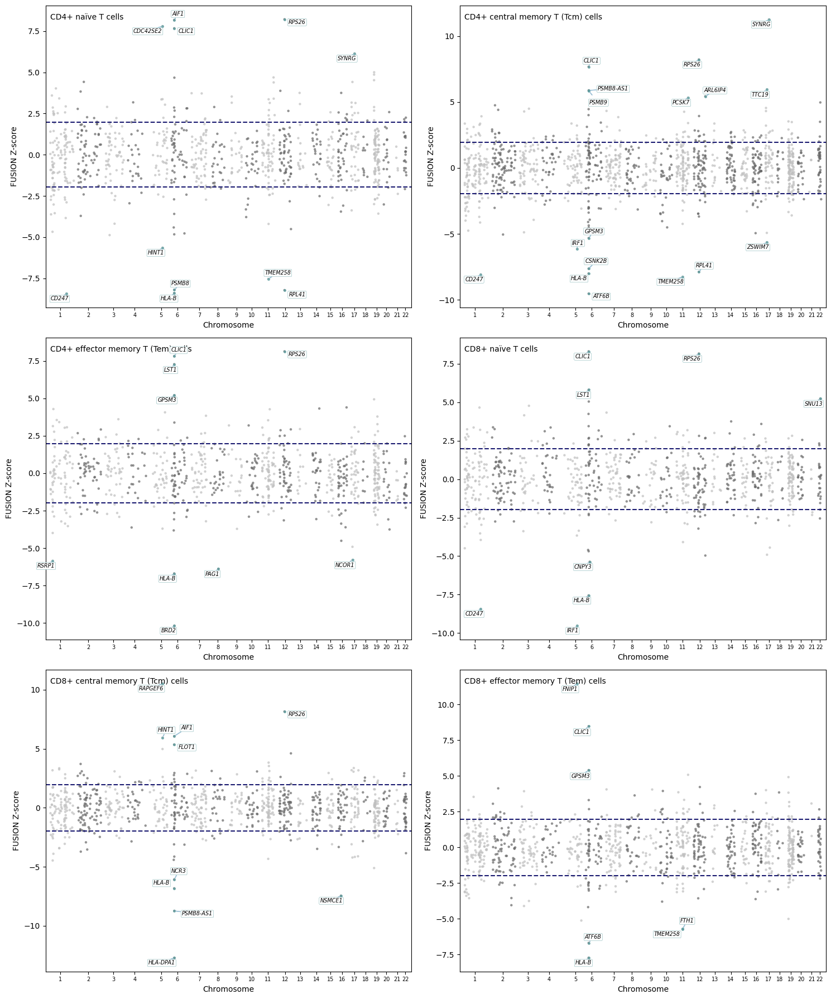

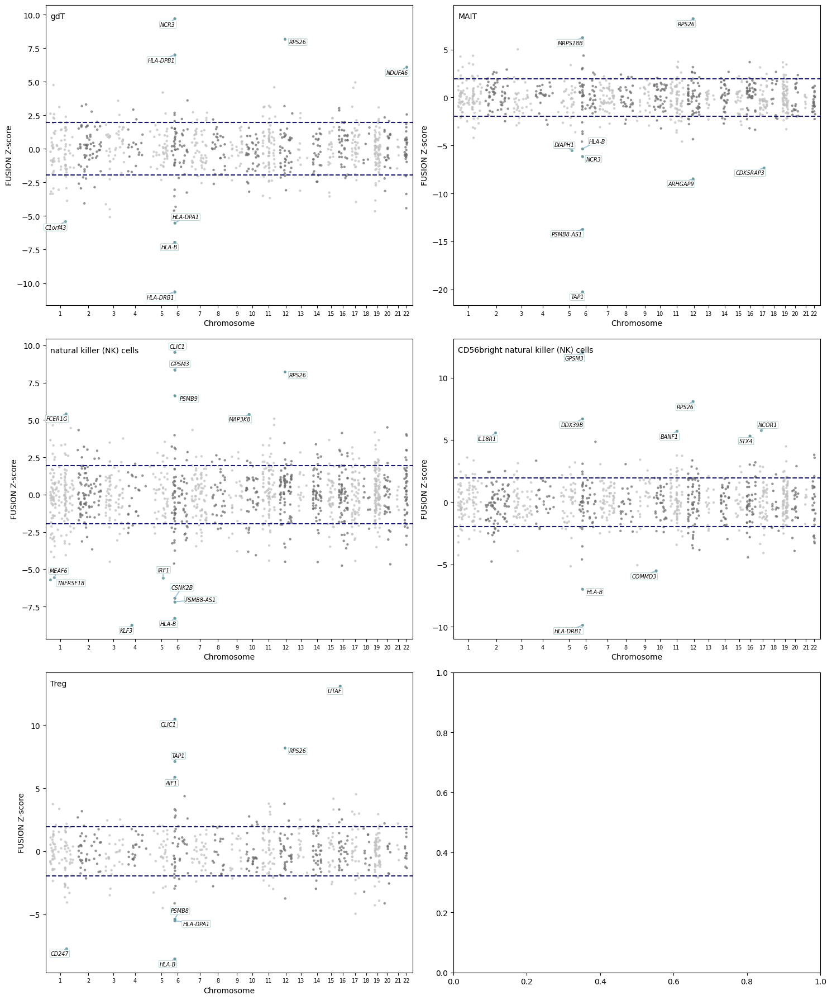

In [17]:
index = 0
for celltype_panel in [celltypes_panel_1, celltypes_panel_2, celltypes_panel_3]:
    index += 1

    fig,axes = plt.subplots(3, 2, figsize=(15,18))
    axs = axes.flatten()

    significance_z=1.96
    significance_color="cadetblue"
    s=5
    xaxis_padding=5e7

    for ct,ax in zip(celltype_panel,axs):
        subset = df_twas_celltypes.loc[df_twas_celltypes["PANEL"] == ct]
        name_formatted = subset["PANEL.CLEANED"].unique()[0]
        highlighted = subset.loc[subset["TWAS.P"] < bonferroni_tissue_threshold]

        pt1 = ax.scatter(
            subset["Position"], subset["TWAS.Z"], c=subset["CHROM_COLOR"], s=s, alpha=.6,
            rasterized=False
        )

        # I changed the default color from the manhattan plot from earlier
        ln1 = ax.axhline(-significance_z, color="midnightblue", linestyle="--", label=f"Z = {significance_z}")
        ln2 = ax.axhline(significance_z, color="midnightblue", linestyle="--", label=f"Z = {significance_z}")
        pt2 = ax.scatter(
            highlighted["Position"], highlighted["TWAS.Z"], c=significance_color, s=s+2, alpha=.7,
            rasterized=True
        )

        # Label the subset that we're looking at with the "fancy" formatting
        title = ax.annotate(name_formatted, (0, subset["TWAS.Z"].max()))

        texts = []
        for _,row in highlighted.iterrows():
            texts.append(ax.text(row["Position"], row["TWAS.Z"], row["ID"],
                ha='center', va='center',
                fontsize="x-small", fontstyle='italic',
                bbox=dict(
                    facecolor='white', edgecolor=significance_color, boxstyle='round,pad=.15', linewidth=.3)
            ))

        adjust_text(
            texts,
            expand=(1.1,1.5),
            arrowprops=dict(arrowstyle='simple', color='#A3C5D9', lw=1), # changed to color in manhattan
            min_arrow_len=3,
            ax=ax,
        )

        ax.set_xticks(chrom_midpoints_celltypes) # label chromosome-by-chromosome instead of position
        ax.set_xticklabels(chrom_midpoints_celltypes.index.astype(int), fontsize=7)
        ax.set_xlim(df_twas_celltypes["Position"].min() - xaxis_padding, df_twas_celltypes["Position"].max() + xaxis_padding)
        ax.set_xlabel("Chromosome")
        ax.set_ylabel("FUSION Z-score")

    plt.tight_layout()
    plt.savefig(f"svg/miami_CELLTYPES-PART-{index}.svg", format="svg", dpi=1200)
    plt.show()